# Preprocessing and clustering scRNAseq datasets
##### uses magic for normalization

In [1]:
# imports libraries 
import os
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import seaborn as sns
import matplotlib.pyplot as plt
from harmony import harmonize
import scanpy.external as sce

In [2]:
# error settings to avoid crowding the notebook
sc.settings.verbosity = 0             
%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['font.size'] = 6
pd.set_option("display.max_rows", 50, "display.max_columns", 50)
sns.set_style("ticks")
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=300, frameon=True, vector_friendly=True, fontsize=20, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0,
                             order = None): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props = cluster_props.reindex(order)

    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig


Read in processed anndata with scanpy

In [5]:
adata_scr = sc.read_h5ad('/home/sanjavickovic/data/sc_anndatas/adata_larger_relabeling_after_tsne.h5ad')

Read in magic normalized data

In [6]:
# reads in magic data 
adata_scr_magic = sc.read_h5ad('/home/sanjavickovic/data/magic_genes/magic_subset_sig_all_sc_genes_new.h5ad')

Subset to same obs

In [7]:
adata_scr = adata_scr[adata_scr_magic.obs.index,:]

Exhanges norm values in scanpy to magic

In [52]:
adata_scr.X = adata_scr_magic.X

In [53]:
### Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
#sc.pp.regress_out(adata_scr, ['total_counts', 'pct_counts_mt', 'S_score', 'G2M_score'])
### Scale each gene to unit variance. Clip values exceeding standard deviation 10. 
#sc.pp.scale(adata_scr, max_value=10)

## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [54]:
%env PYTHONHASHSEED=0
sc.tl.pca(adata_scr, svd_solver='arpack')
sc.pp.neighbors(adata_scr, n_neighbors=20, n_pcs=20)
sc.tl.umap(adata_scr)

env: PYTHONHASHSEED=0


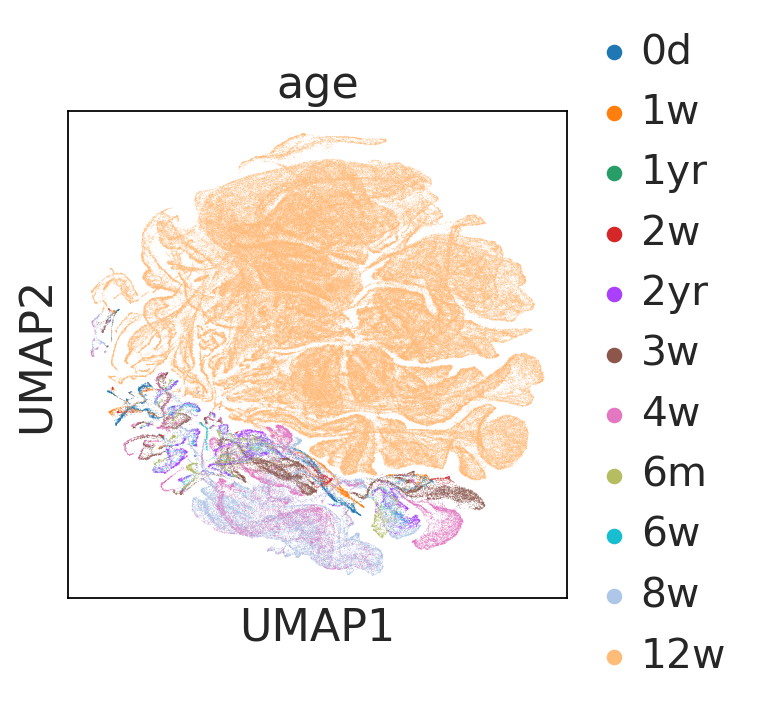

In [55]:
# Sanity check before harmony
sc.pl.umap(adata_scr, color=['age',])

In [56]:
adata_scr.write('/home/sanjavickovic/data/sc_anndatas/adata_larger_relabeling_before_harmony_magic.h5ad')

In [57]:
#adata_scr = sc.read_h5ad('/home/sanjavickovic/data/sc_anndatas/adata_larger_relabeling_before_harmony_magic.h5ad')

### Use harmony for batch correction 

In [58]:
'Use harmony to correct for difference between animals'
adata_scr.obsm['X_harmony'] = harmonize(np.array(adata_scr.obsm['X_pca']), adata_scr.obs, batch_key = ['Sample_ID'])
sc.pp.neighbors(adata_scr, use_rep='X_harmony', n_neighbors=20, n_pcs=20)
sc.tl.umap(adata_scr)

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


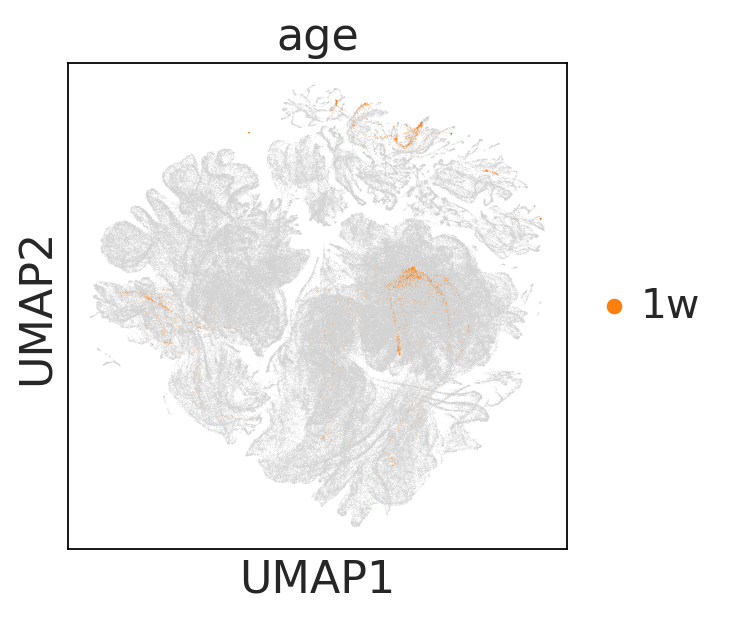

In [59]:
#sanity check after harmony
sc.pl.umap(adata_scr, color=['age',], groups = ['1w'])

We can make a scatter plot in the UMAP coordinates

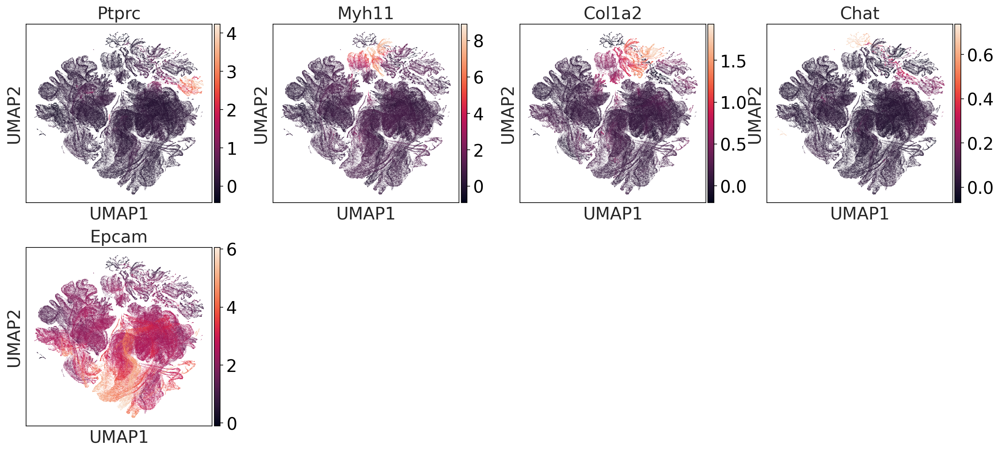

In [60]:
# plots sanity check for 4 genes
sc.pl.umap(adata_scr, color=['Ptprc', 'Myh11', 'Col1a2', 'Chat', 'Epcam'], use_raw = False)

Let us inspect the contribution of single PCs to the total variance in the data. This is a sanity check that we picked correct npcs.

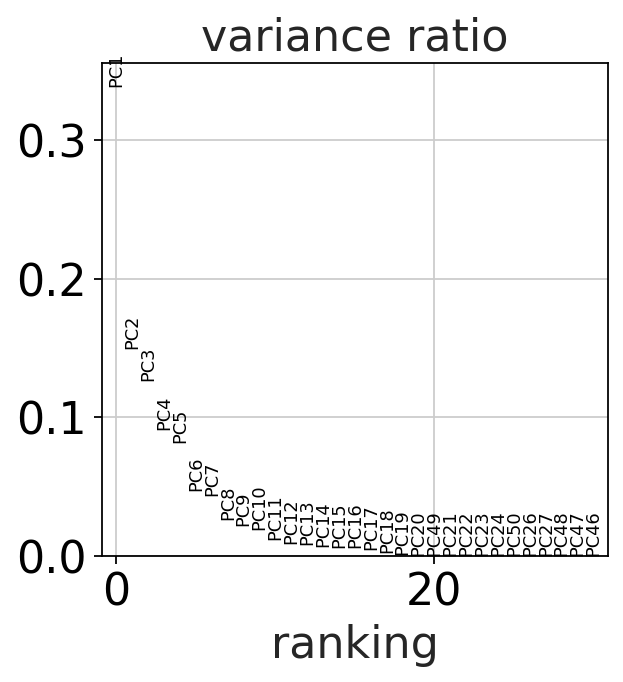

In [61]:
sc.pl.pca_variance_ratio(adata_scr, log=False)

Save the result.

In [62]:
adata_c = adata_scr.copy()

## Clustering the neighborhood graph

In [73]:
sc.tl.leiden(adata_c, key_added='leiden', resolution = 0.25)

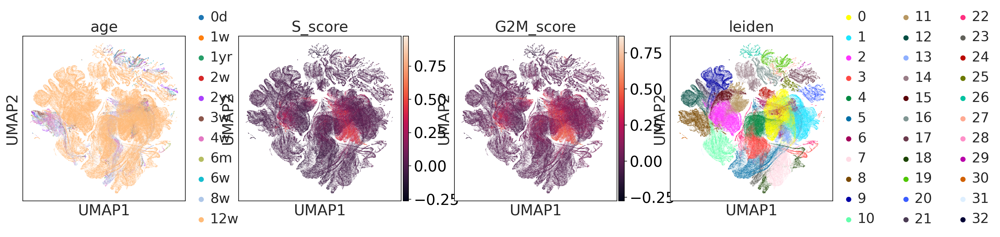

In [74]:
#plots the graphs
sc.pl.umap(adata_c, color=['age', 'S_score', 'G2M_score', 'leiden'], use_raw=False)

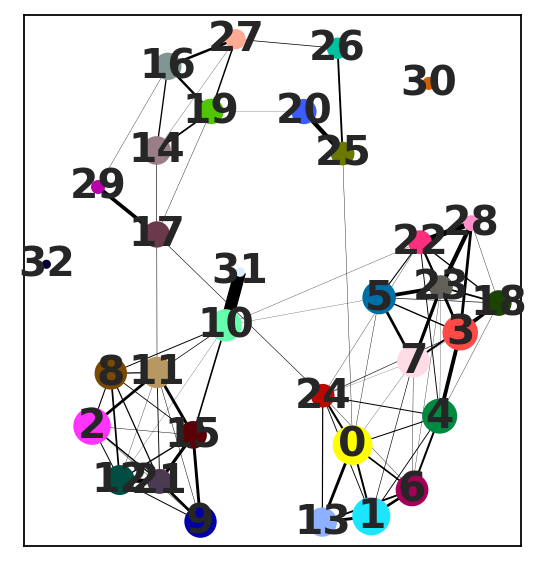

In [75]:
# make paga
sc.tl.paga(adata_c, groups = 'leiden')
sc.pl.paga(adata_c)  # remove `plot=False` if you want to see the coarse-grained graph

In [76]:
print('A total of ', len(adata_c.obs.index), ' cells in this dataset.')

A total of  418730  cells in this dataset.


In [77]:
adata_c.write_h5ad('/home/sanjavickovic/data/sc_anndatas/adata_larger_after_harmony_magic.h5ad')

In [78]:
#adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_before_tsne_magic.h5ad')

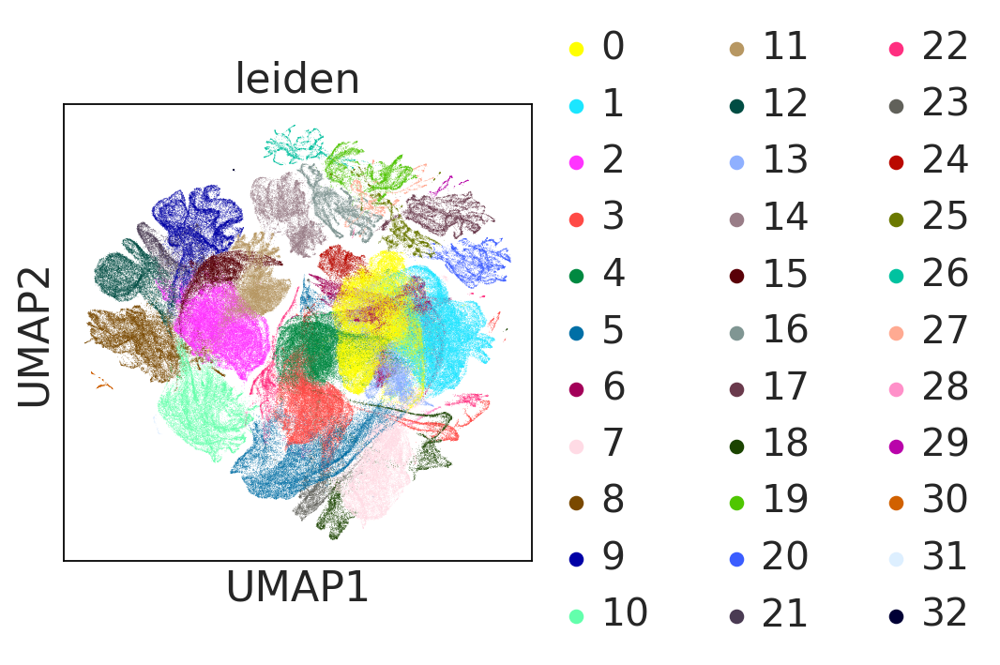

In [79]:
sc.pl.umap(adata_c, color='leiden')

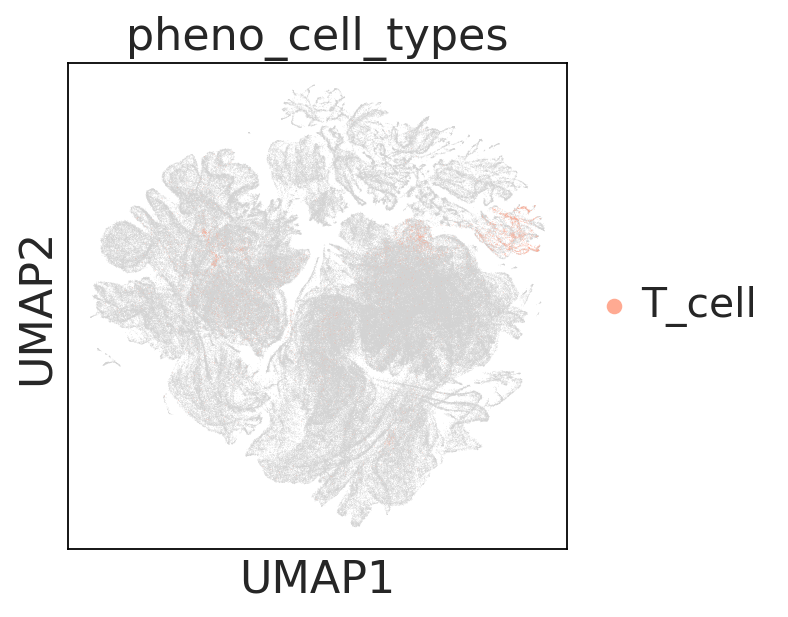

In [72]:
sc.pl.umap(adata_c, color='pheno_cell_types', groups = ['T_cell'])

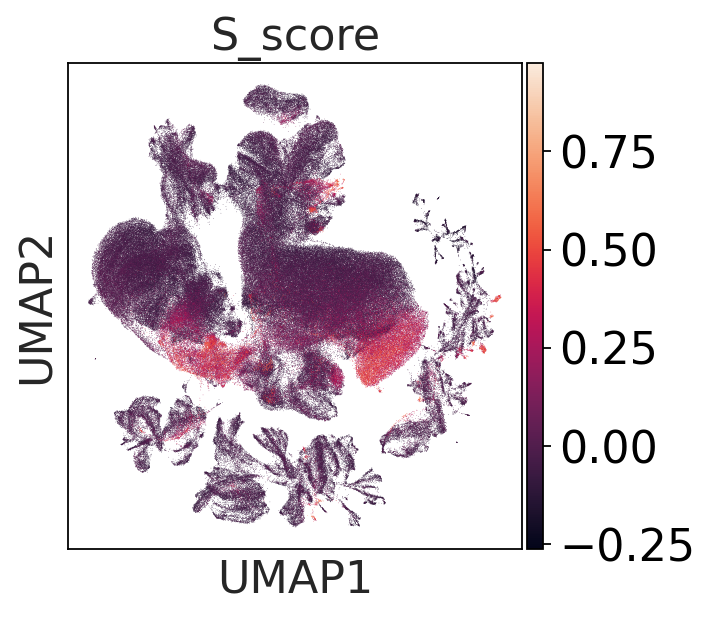

In [111]:
sc.pl.umap(adata_c, color='S_score')

In [183]:
# do cluster renaming to be sure all possible cells make it
leiden_to_ct = {
    '0' : 'TA_1', #okok
    '1' : 'Stem', #okok
    '2' : 'Stem',  #okok
    '3' : 'TA_2',#okok  
    '4' : 'Colonocyte', #okok  
    '5' : 'TA_3', #okok
    '6' : 'TA_5', #okok
    '7' : 'TA_4', #okok
    '8' : 'Myocyte', #okok  
    '9' : 'Lymphatic',  #okok
    '10' : 'TA_6', #okok 
    '11' : 'Cycling_TA_1', #okok
    '12' : 'TA_3', #okok
    '13' : 'Cycling_TA_1', #okok
    '14' : 'TA_7', #okok  
    '15' : 'TA_5', #okok 
    '16' : 'TA_3',#okok
    '17' : 'Fibroblast', #okok 
    '18' : 'TA_8', #okok   
    '19' : 'Cycling_TA_2', #okok 
    '20' : 'B_cell', #okok
    '21' : 'Colonocyte',#okok
    '22' : 'Glia', #okok
    '23' : 'Colonocyte', #okok 
    '24' : 'Vascular', #okok
    '25' : 'Enteroendocrine_1', #okok 
    '26' : 'Fibroblast', #okok
    '27' : 'Macrophage', #okok
    '28' : 'Goblet', #okok
    '29' : 'T_cell', #okok
    '30' : 'Myocyte', #okok
    '31' : 'Tuft', #okok
    '32' : 'Neuron_1', #okok
    '33' : 'Enteroendocrine_2', #okok
    '34' : 'Mesothelial', #okok
    '35' : 'Neuron_2', #okok
    '36' : 'nan', #okok
    '37' : 'nan',  #okok
    '38' : 'nan',  #okok
}

In [184]:
adata_c.obs['leiden_cell_types'] = pd.Categorical(adata_c.obs['leiden'].replace(leiden_to_ct))

In [185]:
adata_c = adata_c[adata_c.obs.leiden_cell_types != 'nan']

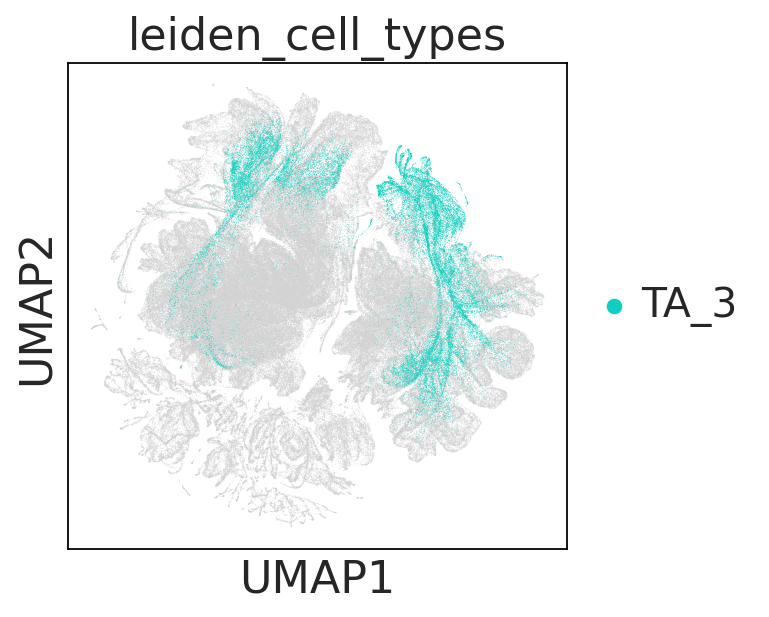

In [52]:
sc.pl.umap(adata_c, color=['leiden_cell_types'], use_raw=False, groups = 'TA_3')

In [121]:
print('A total of ', len(adata_c.obs.index), ' cells in this dataset.')

A total of  421871  cells in this dataset.


Save this anndata object (raw and processed)

In [ ]:
#adata_c.write_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling.h5ad')

In [ ]:
#adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling.h5ad')

In [186]:
adata_c.obs['leiden_major_cell_types'] = [i.split("_")[0] for i in adata_c.obs.leiden_cell_types]

Trying to set attribute `.obs` of view, copying.


#### Plots total cluster cell proportions

In [187]:
props = get_cluster_proportions(adata_c,
                            cluster_key="leiden_major_cell_types",
                            sample_key="age",
                            drop_values=None)

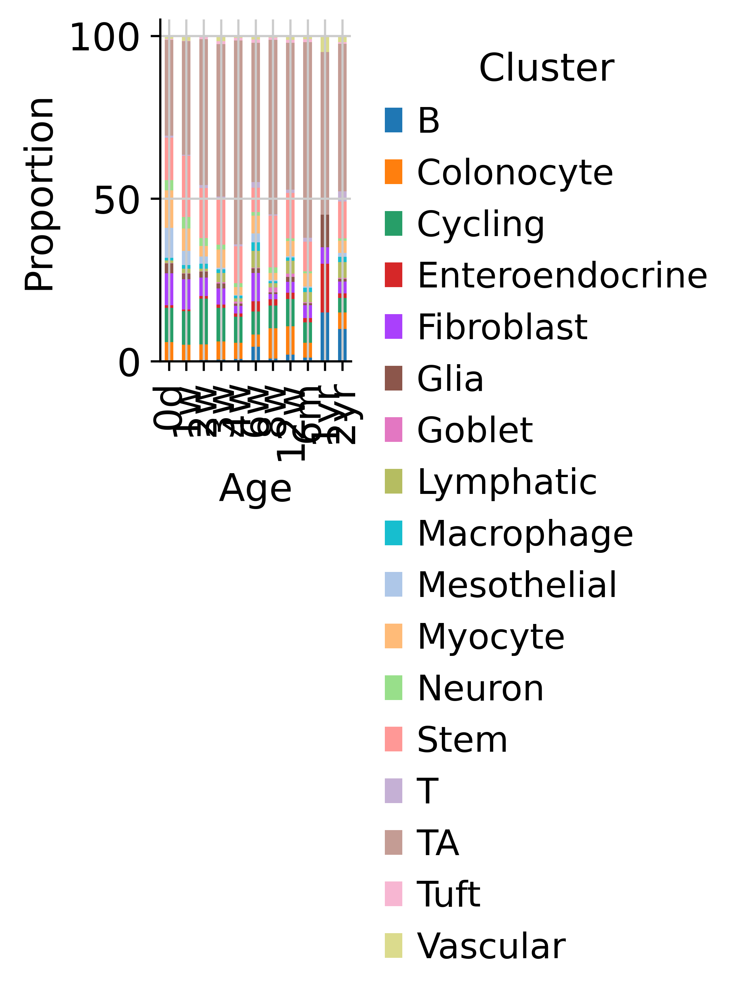

In [188]:
pl = plot_cluster_proportions(props, cluster_palette=None, xlabel_rotation=90, order = ['0d', '1w', '2w', '3w', '4w', '6w', '8w', '12w', '6m', '1yr', '2yr'])

In [189]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(adata_c, groupby = 'leiden_major_cell_types', use_raw=False, groups='all', reference='rest',key_added='leiden_major_cell_types', method='t-test', corr_method='benjamini-hochberg')

... storing 'leiden_major_cell_types' as categorical
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


In [190]:
'Plot rankged genes'
sc.pl.rank_genes_groups_dotplot(adata_c, key='leiden_major_cell_types', n_genes=3, groupby=['leiden_major_cell_types'], standard_scale = 'var',)

ValueError: Incompatible observations. Dendrogram data has 16 categories but current groupby observation ['leiden_major_cell_types'] contains 17 categories. Most likely the underlying groupby observation changed after the initial computation of `sc.tl.dendrogram`. Please run `sc.tl.dendrogram` again.'

In [ ]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(adata_c, groupby = 'leiden_cell_types', use_raw=False, groups='all', reference='rest',key_added='leiden_minor_cell_types', method='t-test', corr_method='benjamini-hochberg')

In [ ]:
'Plot rankged genes'
sc.tl.dendrogram(adata_c, groupby = 'leiden_cell_types')
sc.pl.rank_genes_groups_dotplot(adata_c, key='leiden_minor_cell_types', n_genes=3, groupby=['leiden_cell_types'], standard_scale = 'var',)

In [ ]:
#adata_c.write_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling.h5ad')

In [ ]:
#adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling.h5ad')

In [94]:
'Use Phenograph'
result = sce.tl.phenograph(adata_c.obsm['X_harmony'], k = 75)
adata_c.obs['pheno'] = pd.Categorical(result[0])

Finding 75 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 231.1739420890808 seconds


OSError: [Errno 12] Cannot allocate memory

In [ ]:
sc.pl.umap(adata_c, color = ['pheno_cell_types'], s = 10,  legend_fontsize = 10)

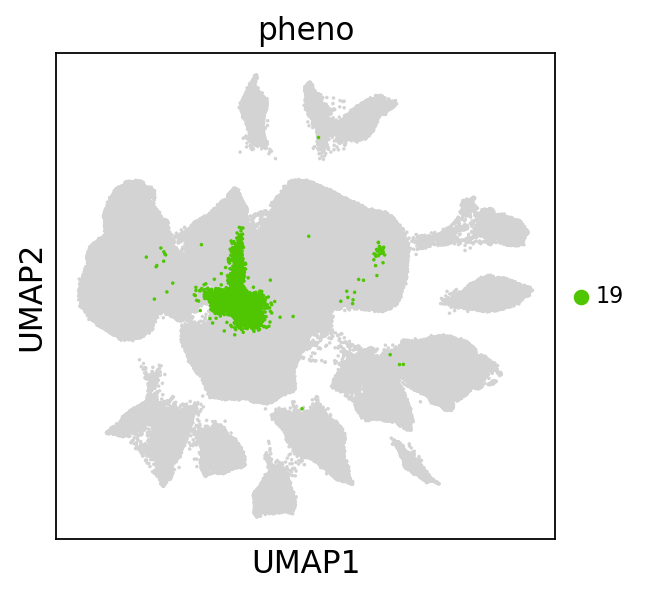

In [254]:
sc.pl.umap(adata_c, color = ['pheno'], s = 10,  legend_fontsize = 10, groups = [19])

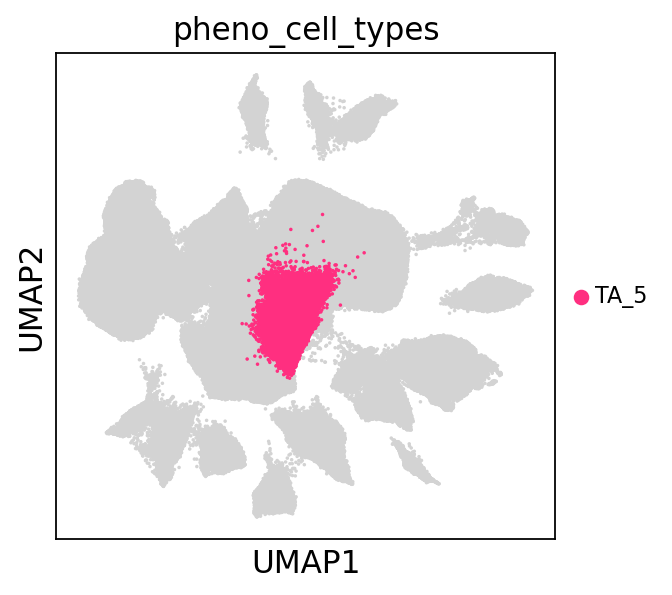

In [265]:
sc.pl.umap(adata_c, color = ['pheno_cell_types'], groups = ['TA_5'], s = 10, legend_fontsize = 10)

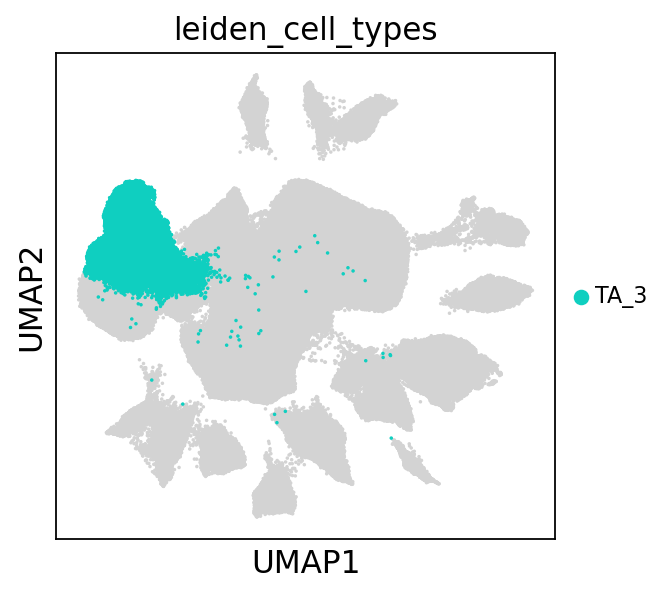

In [269]:
sc.pl.umap(adata_c, color = ['leiden_cell_types'], groups = ['TA_3'], s= 10, legend_fontsize = 10)

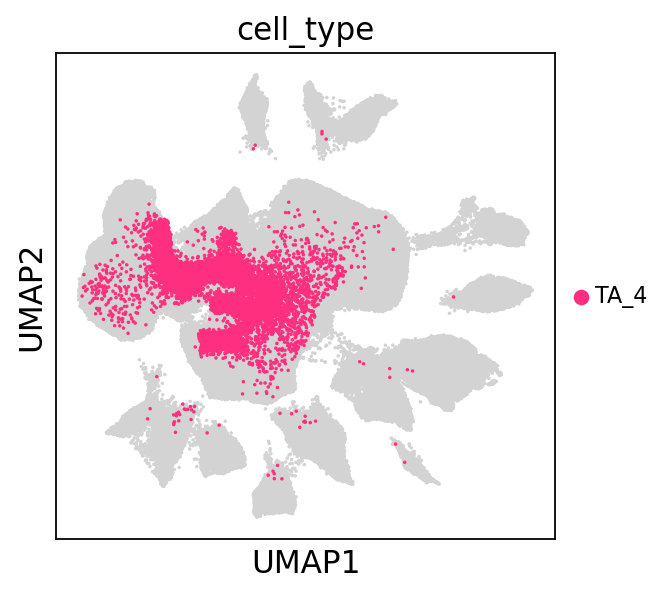

In [260]:
sc.pl.umap(adata_c, color = ['cell_type'], groups = ['TA_4'],s= 10, legend_fontsize = 10)

In [93]:
# do cluster renaming to be sure all possible cells make it
pheno_to_ct = {
    0 : 'Stem_1', #okok
    1 : 'TA_1', #okok
    2 : 'TA_3', #okok
    3 : 'TA_4', #pkok 
    4 : 'Cycling_TA_1',#okok   
    5 : 'Colonocyte', #okok
    6 : 'TA_5', #okok
    7 : 'Myocye', #okok
    8 : 'Lymphatic',  #okok
    9 : 'Cycling_TA_1', #okok
    10 : 'TA_3', #okok
    11 : 'TA_7',#okok
    12 : 'Colonocyte',#okok 
    13 : 'Fibroblast',#okok 
    14 : 'TA_2', #okok
    15 : 'B_cell', #okok
    16 : 'Cycling_TA_2', #okok
    17 : 'Stem',#okok
    18 : 'Glia', #okok 
    19 : 'Colonocyte', #okok
    20 : 'Vascular', #okok 
    21 : 'Enteroendocrine_1', #okok
    22 : 'Fibroblast', #okok
    23 : 'Macrophage', #okok 
    24 : 'Goblet', #okok 
    25 : 'T_cell', #okok
    26 : 'Myocye', #okok 
    27 : 'Tuft', #okok
    28 : 'Colonocyte',#okok 
    29 : 'Enteroendocrine_2', #okok 
    30 : 'Mesothelial', #okok 
    31 : 'Neuron_1', #okok
    32 : 'Colonocyte', #okok
    33 : 'Neuron_1', #okok
    34 : 'nan',#okok
    35 : 'Neuron_2', #ok#ok
    36 : 'Colonocyte', #okok 
    37 : 'Neuron_2', #okok 
    38 : 'TA_2', #okok 
    39 : 'Stem', #okok
    40 : 'Fibroblast', #okok
    41 : 'nan', #okok

}

In [94]:
adata_c.obs['pheno_cell_types'] = pd.Categorical(adata_c.obs['pheno'].replace(pheno_to_ct))

In [95]:
adata_c = adata_c[adata_c.obs.pheno_cell_types != 'nan']

In [96]:
#sc.pl.umap(adata_c, color=['pheno_cell_types'], use_raw=False)

In [97]:
adata_c.obs['pheno_major_cell_types'] = [i.split("_")[0] for i in adata_c.obs.pheno_cell_types]

Trying to set attribute `.obs` of view, copying.


In [98]:
#adata_c.write_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_before_tsne.h5ad')

In [99]:
#adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_before_tsne.h5ad')

In [ ]:
'Do tsne on pheno'
sc.tl.tsne(adata_c, use_rep = "X_harmony", n_pcs=20, random_state = 7,  perplexity=60, use_fast_tsne = True)


In [ ]:
adata_c.write_h5ad('/home/sanjavickovic/data/sc_anndatas/adata_larger_relabeling_after_tsne_magic.h5ad')

In [102]:
#adata_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_after_tsne.h5ad')

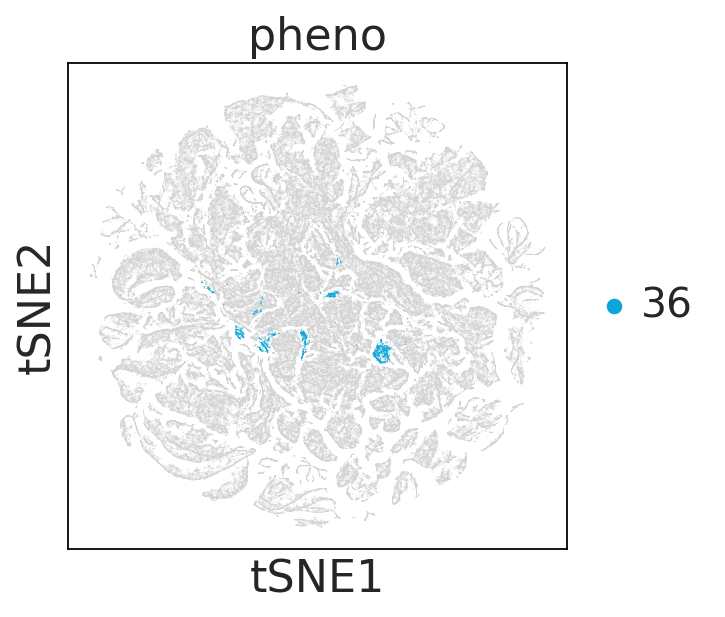

In [72]:
sc.pl.tsne(adata_c, color=['pheno'], groups = [36], use_raw=False, )

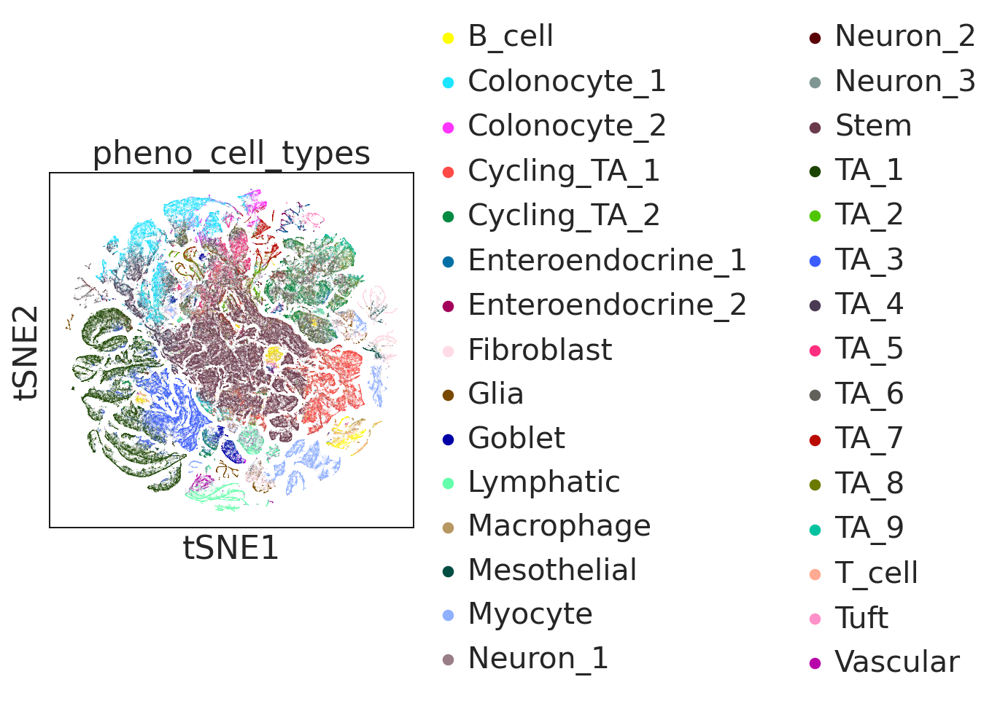

In [73]:
sc.pl.tsne(adata_c, color=['pheno_cell_types'], use_raw=False)

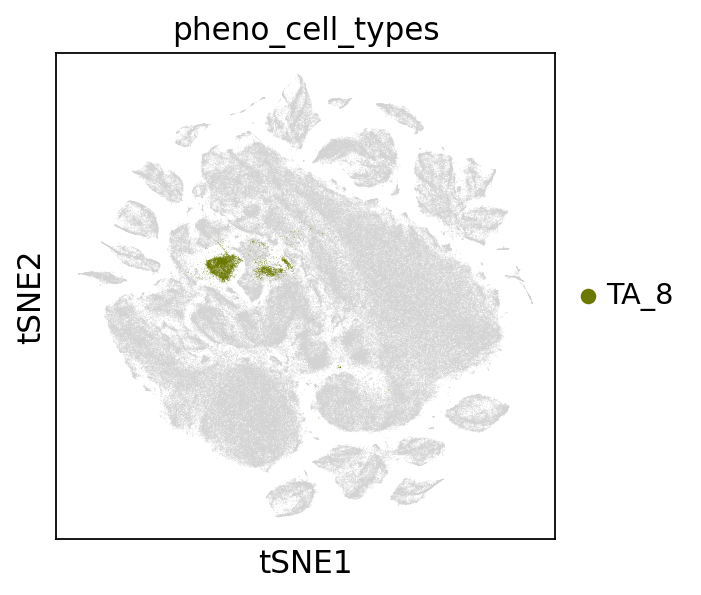

In [59]:
sc.pl.tsne(adata_c, color=['pheno_cell_types'], groups = 'TA_8', use_raw=False)

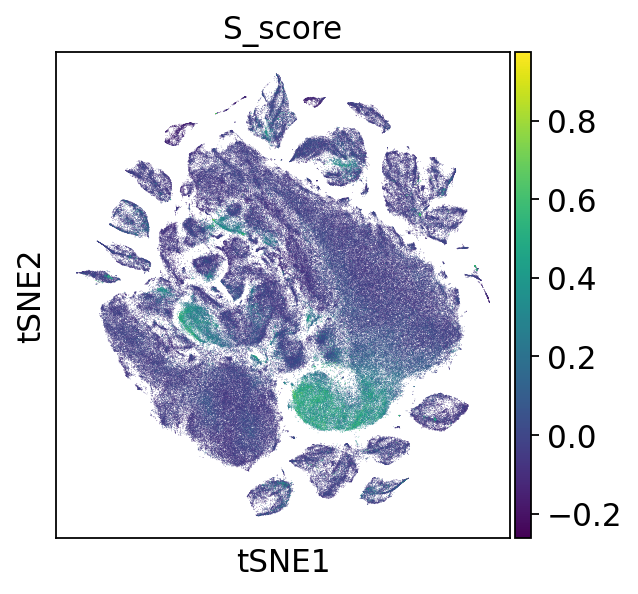

In [18]:
sc.pl.tsne(adata_c, color=['S_score'],  use_raw=False)

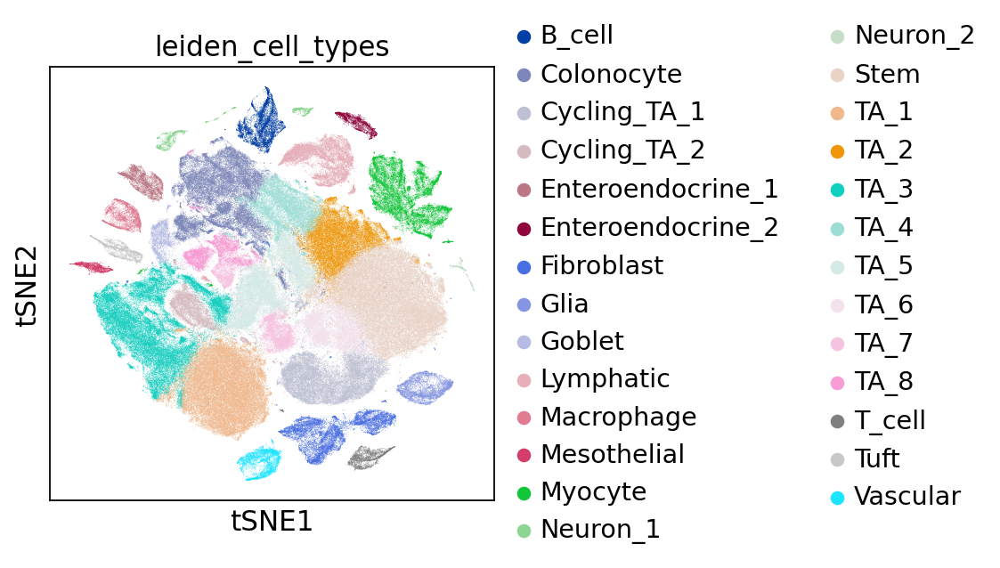

In [11]:
sc.pl.tsne(adata_c, color=['leiden_cell_types'], use_raw=False)

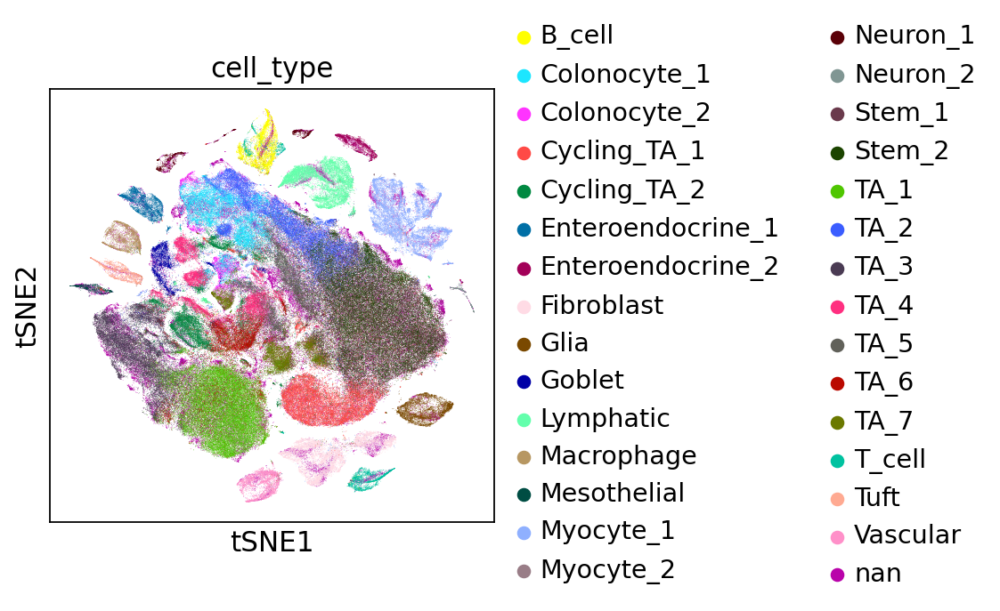

In [41]:
sc.pl.tsne(adata_c, color=['cell_type'],   use_raw=False)

... storing 'pheno_major_cell_types' as categorical


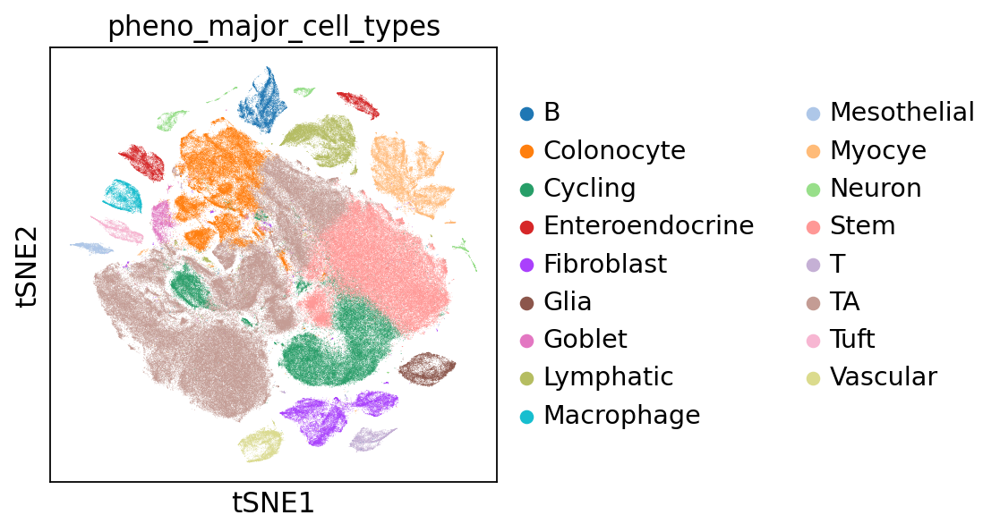

In [74]:
sc.pl.tsne(adata_c, color=['pheno_major_cell_types'], use_raw=False)

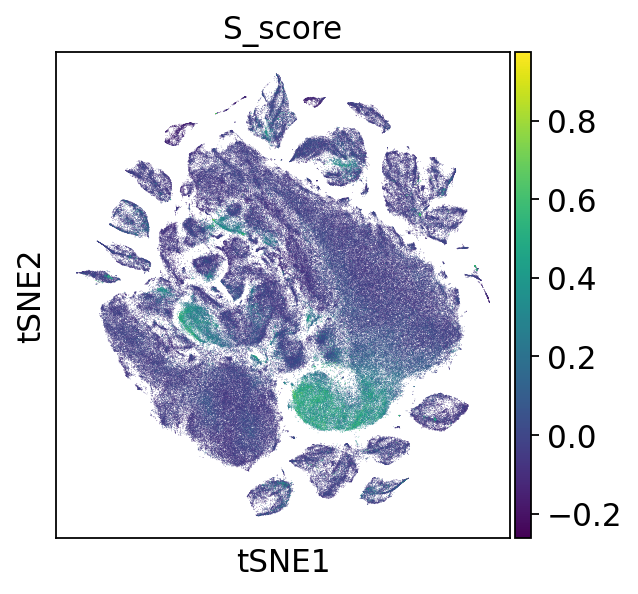

In [14]:
sc.pl.tsne(adata_c, color=['S_score'], use_raw=False)

In [105]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(adata_c, groupby = 'pheno_major_cell_types', use_raw=False, groups='all', reference='rest',key_added='pheno_major_cell_types', method='t-test', corr_method='benjamini-hochberg')

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


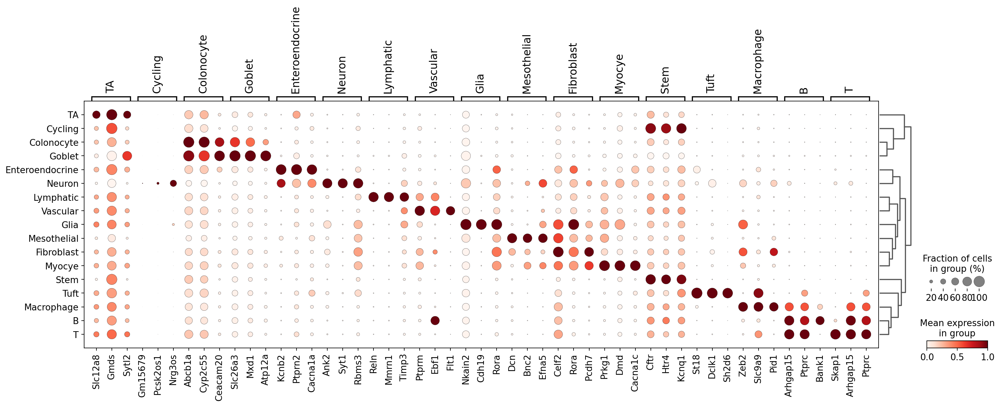

In [106]:
'Plot rankged genes'
sc.pl.rank_genes_groups_dotplot(adata_c, key='pheno_major_cell_types', n_genes=3, groupby=['pheno_major_cell_types'], standard_scale = 'var', use_raw = True)

In [107]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(adata_c, groupby = 'pheno_cell_types', use_raw=False, groups='all', reference='rest',key_added='pheno_minor_cell_types', method='t-test', corr_method='benjamini-hochberg')

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


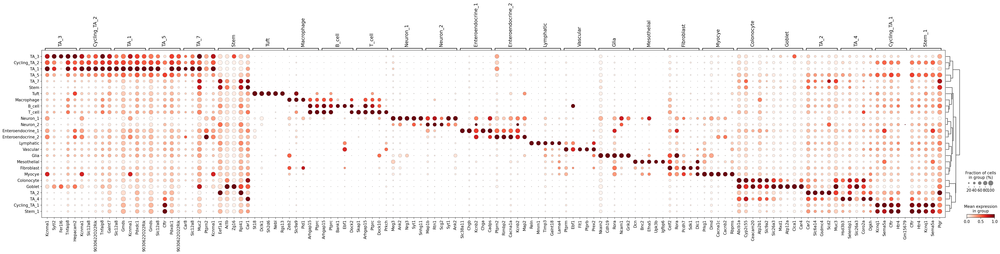

In [108]:
'Plot rankged genes'
sc.tl.dendrogram(adata_c, groupby = 'pheno_cell_types')
sc.pl.rank_genes_groups_dotplot(adata_c, key='pheno_minor_cell_types', n_genes=5, groupby=['pheno_cell_types'], standard_scale = 'var',)

In [ ]:
#adata_c.write_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_after_tsne.h5ad')

In [ ]:
# Set raw counts back in anndata 
## use adata_large 

In [3]:
#data_c = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_larger_relabeling_after_tsne.h5ad')

In [ ]:
# read in magic data and repeat clustering 